# Baseline model: tf-idf features


As baseline model model based on tf-idf features was chosen.

Good side of this model: it can be easily seen on what features(=tokens) model's predictions are based.

For explanation of model output line framework will be used.

In [15]:
## for data
import json
import pandas as pd
import numpy as np
## for plotting
import matplotlib.pyplot as plt
import seaborn as sns
## for processing
import re
import nltk
## for bag-of-words
from sklearn import model_selection, naive_bayes
from sklearn import pipeline, manifold, preprocessing, feature_selection, feature_extraction
## for explainer
from lime import lime_text


# for text preprocessing
from pymorphy2 import MorphAnalyzer
from nltk.corpus import stopwords

# custom
from text_classifier.common.preprocessing import preprocess_text

RANDOM_SEED = 123

In [2]:
import nltk
# nltk.download()

In [3]:
df = pd.read_csv("../data/interim/train_no_dup.csv", index_col=0)

The dataset is almost balanced.

## 1. Preprocessing

In [4]:
stopwords_ru = stopwords.words("russian")
morph = MorphAnalyzer()


df["text_clean"] = df["text"].apply(lambda x: preprocess_text(x, morph, stopwords_ru ))
df.head()

,oid,category,text,text_clean
0,365271984,winter_sport,Волшебные фото Виктория Поплавская ЕвгенияМедв...,волшебный фото виктория поплавский евгениямедв...
1,503385563,extreme,Возвращение в подземелье Треша 33 Эйфория тупо...,возвращение подземелье треш число эйфория тупо...
2,146016084,football,Лучшие чешские вратари – Доминик Доминатор Гаш...,хороший чешский вратарь доминик доминатор гаше...
3,933865449,boardgames,Rtokenoid Warhammer40k валрак решил нас подкор...,число валрак решить подкормить сильно свежий с...
4,713550145,hockey,Шестеркин затаскивает Рейнджерс в финал Восточ...,шестёркин затаскивать рейнджерс финал восточны...


In [5]:
df.to_csv("../data/processed/train_tf_idf.csv")

### Split into train/ test in such way that there is no intersection by oid

In [7]:
from sklearn.model_selection import GroupShuffleSplit

gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=0)
train_index, test_index =  next(gss.split(df, df.category, groups=df.oid))

In [8]:
train_index.shape, test_index.shape

((28516,), (7115,))

In [9]:
df_train = df.iloc[train_index]
df_test = df.iloc[test_index]

y_train = df_train["category"].values
y_test = df_test["category"].values

In [10]:
df_train.to_csv("../data/processed/tran_split.csv")
df_test.to_csv("../data/processed/val_split.csv")

In [11]:
len(set(df_test.oid).intersection(df_train.oid))

0

In [12]:
CLASSES = np.unique(y_train)

## 2. TfidfVectorizer

In [16]:
## Tf-Idf
vectorizer = feature_extraction.text.TfidfVectorizer(max_features=10000, ngram_range=(1,2))

corpus = df_train["text_clean"]
vectorizer.fit(corpus)
X_train = vectorizer.transform(corpus)
dic_vocabulary = vectorizer.vocabulary_

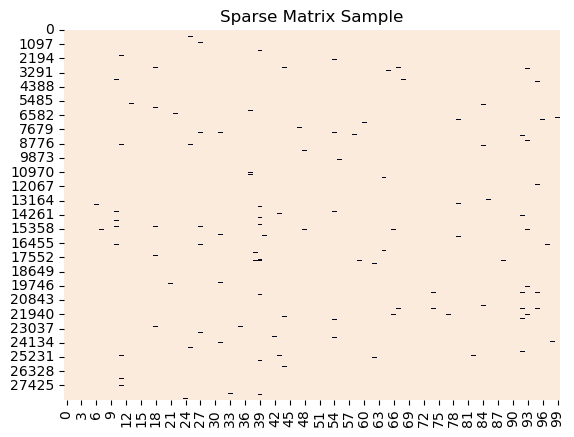

In [17]:
df_for_visualization =  X_train.todense()[:,np.random.randint(0, X_train.shape[1],100)]==0
sns.heatmap(df_for_visualization, vmin=0, vmax=1, cbar=False).set_title('Sparse Matrix Sample');

In [18]:
X_train.todense().shape

(28516, 10000)

In [19]:
dic_vocabulary['аут']

456

In [20]:
dic_vocabulary['привет']

6183

## 3. Feature Selection

1. treat each category as binary (for example, the “tennis” category is 1 for the tennis texts and 0 for the others);
2. perform a Chi-Square test to determine whether a feature and the (binary) target are independent;
3. keep only the features with a certain p-value from the Chi-Square test.

In [21]:
y = df_train["category"]
X_names = vectorizer.get_feature_names_out()
p_value_limit = 0.9

selected_features = set()
df_features = []

for cat in np.unique(y):
    binary_target = y==cat
    chi2, p = feature_selection.chi2(X_train, binary_target)
    
    for feat_name, chi2_val, p_val in zip(X_names, chi2, p):
        if 1 - p_val > p_value_limit:
            selected_features.add(feat_name)
            df_features.append({"y": cat, "feature": feat_name, "score": 1 - p_val})



In [22]:
len(selected_features)

7613

In [23]:
df_features = pd.DataFrame(df_features).sort_values("score")

I reduced the number of features from 10,000 to 7563 by keeping the most statistically relevant ones. Let’s print some:

### 3.1. Most frequent words in the category in terms of tf-idf

In [24]:
for cat in np.unique(y):
    print("# {}:".format(cat))
    print("  . selected features:", len(df_features[df_features["y"]==cat]))
    print("  . top features:", ",".join(df_features[df_features["y"]==cat]["feature"].values[:10]))
    print(" ")

# athletics:
  . selected features: 959
  . top features: мл,утром,круг турнир,школьный,погода,цена число,фото,мужчина,бывший,первый
 
# autosport:
  . selected features: 963
  . top features: второй круг,поздравлять день,поступать,именно,конец,финал сезон,борьба победа,понимать,завоевать,наспорт
 
# basketball:
  . selected features: 668
  . top features: вес,игрок мир,де,бег спорт,бокс,утро число,упражнение,событие,первый половина,уничтожать
 
# boardgames:
  . selected features: 1069
  . top features: решать,биатлон,ключ,наверняка,подробно,выступление,металлург,женский,против,судья
 
# esport:
  . selected features: 609
  . top features: переходить,анкета,круг турнир,рафаэль,вк,случайный образ,игровой,металлург,аудитория,сша
 
# extreme:
  . selected features: 1151
  . top features: передать,реал,майами,рассказать,канадский,журналист,число,мадрид,мир,деталь
 
# football:
  . selected features: 597
  . top features: второй круг,руслан,исполнять,аарон,поражение,комментарий,регулярный,

We can refit the vectorizer on the corpus by giving this new set of words as input. That will produce a smaller feature matrix and a shorter vocabulary.

In [25]:
vectorizer = feature_extraction.text.TfidfVectorizer(vocabulary=X_names)
vectorizer.fit(corpus)
X_train = vectorizer.transform(corpus)
dic_vocabulary = vectorizer.vocabulary_

## 4. Naive Bayes classifier

In [26]:
classifier = naive_bayes.MultinomialNB()

## pipeline
model = pipeline.Pipeline([("vectorizer", vectorizer),  
                           ("classifier", classifier)])
## train classifier
model["classifier"].fit(X_train, y_train)
## test
X_test = df_test["text_clean"].values
y_pred = model.predict(X_test)
predicted_prob = model.predict_proba(X_test)

In [28]:
from text_classifier.common.evaluation import run_classification_report

### 4. Model evaluation

Accuracy: 0.77
Auc: 0.97
Detail:
              precision    recall  f1-score   support

   athletics       0.79      0.81      0.80       515
   autosport       0.71      0.80      0.75       602
  basketball       0.94      0.75      0.84       493
  boardgames       0.79      0.92      0.85       477
      esport       0.73      0.57      0.64       623
     extreme       0.56      0.65      0.60       590
    football       0.76      0.68      0.72       522
      hockey       0.85      0.82      0.83       624
martial_arts       0.74      0.71      0.72       518
   motosport       0.85      0.74      0.79       540
      tennis       0.89      0.94      0.91       503
  volleyball       0.73      0.82      0.77       506
winter_sport       0.81      0.87      0.83       602

    accuracy                           0.77      7115
   macro avg       0.78      0.78      0.77      7115
weighted avg       0.78      0.77      0.77      7115



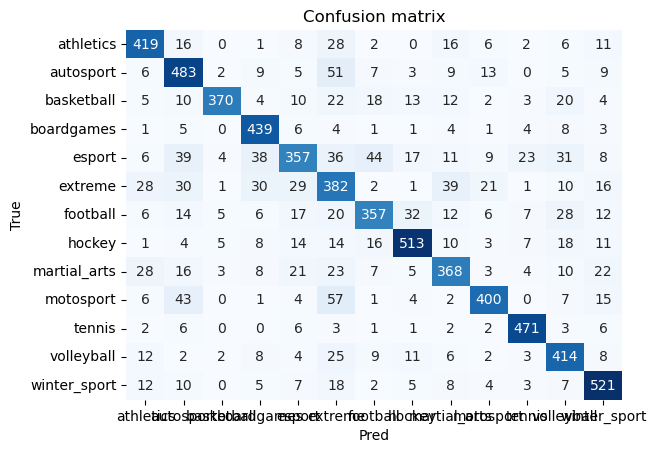

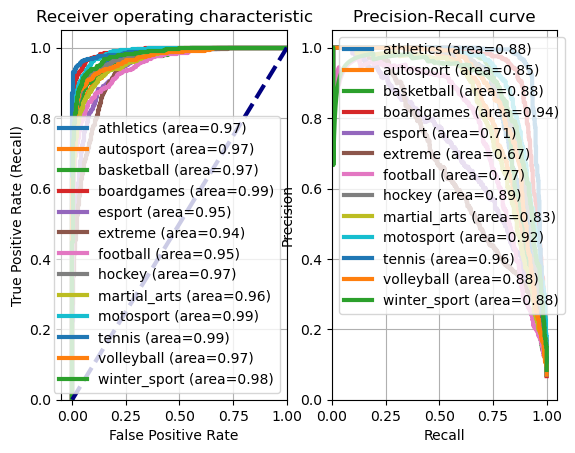

In [30]:
run_classification_report(y_test, y_pred, predicted_prob, CLASSES)

### 4.2 Model explanation

In [31]:
from lime import lime_text

def run_lime_explanation(df_test, y_test, y_pred, probas, i, classes, model):
    txt_instance = df_test["text_clean"].iloc[i]
    # check true value and predicted value
    print("True:", y_test[i], "--> Predicted:", y_pred[i], "| Prob:", round(np.max(probas[i]), 2))
    # show explanation
    explainer = lime_text.LimeTextExplainer(class_names=model.classes_)
    explained = explainer.explain_instance(txt_instance, model.predict_proba, num_features=5, top_labels=len(classes))
    explained.show_in_notebook(text=txt_instance, predict_proba=False)


In [32]:
i = 100
run_lime_explanation(df_test, y_test, y_pred, predicted_prob, i, CLASSES, model)

True: autosport --> Predicted: autosport | Prob: 0.96


In [33]:
i = 200
run_lime_explanation(df_test, y_test, y_pred, predicted_prob, i, y_train, model)

True: winter_sport --> Predicted: winter_sport | Prob: 0.13


In [34]:
i = 3
run_lime_explanation(df_test, y_test, y_pred, predicted_prob, i, y_train, model)

True: tennis --> Predicted: tennis | Prob: 0.68


In [35]:
i = 4
run_lime_explanation(df_test, y_test, y_pred, predicted_prob, i, y_train, model)

True: boardgames --> Predicted: boardgames | Prob: 0.99


In [36]:
i = 5
run_lime_explanation(df_test, y_test, y_pred, predicted_prob, i, y_train, model)

True: boardgames --> Predicted: boardgames | Prob: 0.27


In [37]:
i = 6
run_lime_explanation(df_test, y_test, y_pred, predicted_prob, i, y_train, model)

True: autosport --> Predicted: autosport | Prob: 0.74


### 4.3 Wrong predictions analysis 

In [39]:
i = 7
run_lime_explanation(df_test, y_test, y_pred, predicted_prob, i, y_train, model)

True: motosport --> Predicted: autosport | Prob: 0.53


In [50]:
i = 13
run_lime_explanation(df_test, y_test, y_pred, predicted_prob, i, y_train, model)

True: martial_arts --> Predicted: extreme | Prob: 0.3


In [ ]:
# df_test = df_test.reset_index()
df_test["predicted_prob"] = predicted_prob.max(axis=1)
df_test["predicted"] = y_pred

In [44]:
wrong_pred_df = df_test[y_test != y_pred]

In [45]:
wrong_pred_df.category.value_counts()

category
esport          266
extreme         208
football        165
martial_arts    150
motosport       140
basketball      123
autosport       119
hockey          111
athletics        96
volleyball       92
winter_sport     81
boardgames       38
tennis           32
Name: count, dtype: int64

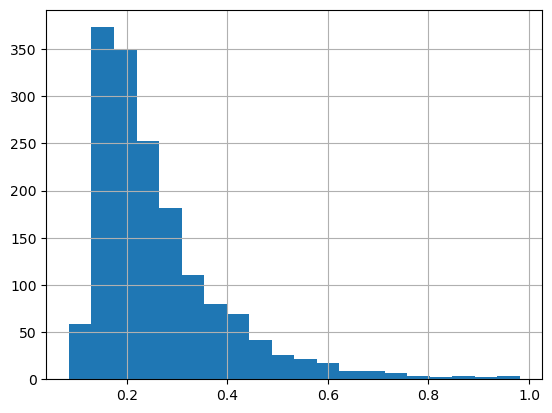

In [46]:
wrong_pred_df.predicted_prob.hist(bins=20);

In [53]:
wrong_pred_df[wrong_pred_df.predicted_prob < 0.5][1:10].text.values

array(['Обувная ложка меч Kessak подарок для настоящего мужчины 33 Узнать цену и сделать заказ ВКонтакте tokentokenoid WhatsApp tokentokenoid Выглядит стильно дорого и приятна на ощупь 33 Станет роскошным украшением для интерьера 33 Вы точно удивите всех оригинальным подарком 33 Не гнется Гарантия на изделие 5 лет Оплата после получения Отправка в течение 24 часов быстрая доставка Отбалансирована как настоящий самурайский меч Оптимальная длина чтобы не наклоняться Индивидуальная гравировка Единственный производитель в России Ручная работа Подвес держатель в подарок Наши обувные ложки вызывают настоящие эмоции даже у самых брутальных мужчин 33 Дарите лучшие подарки своим близким 33 Пишите и получите скидку 33 ВКонтакте tokentokenoid WhatsApp tokentokenoid',
       'Друзья до 10 апреля проходил сбор заявок на конкурс Лучший болельщик МХЛ. Мы получили много откликов. Всем спасибо 33 От нашего клуба на конкурс отправляется это видео с мегапозитивными Юлией и Стасом вы их конечно знаете 33 

### 4.3.1 Summary

From visual analize we can see that wrong preidctions with low confedence(aka probabilty of a predicted label) often contain comments and adds in theis texts. It maybe true that such texts should be labeled as UNKNOWN as they don't really belong to any of a categories.

In [55]:
wrong_pred_df[wrong_pred_df.predicted_prob > 0.5]

,oid,category,text,text_clean,predicted_prob,predicted
31,148430451,motosport,MotoGP Ринс принес уходящей из Больших Призов ...,ринс принести уходить больший приз победа посл...,0.531287,autosport
87,993319379,athletics,Венгры скрестили волейбол и настольный теннис....,венгр скрестить волейбол настольный теннис сто...,0.748373,volleyball
1391,602176355,extreme,Волны приключения детство футболки бордшорты г...,волна приключение детство футболка бордшорты г...,0.587868,boardgames
2121,620580751,extreme,А вы в курсе что Геннадий Малахов является мас...,курс геннадий малахов являться мастер спорт сс...,0.515860,martial_arts
2277,344615861,boardgames,Hotokenoid Games не только в ВК 33 У нашей сет...,вк число наш сеть аккаунт многий соцсеть удобн...,0.518087,volleyball
...,...,...,...,...,...,...
37015,587374870,esport,У Барселоны проблемы с регистрацией новичков. ...,барселона проблема регистрация новичок каталон...,0.526192,football
37339,792608859,basketball,ТОЛЬКО ОРИГИНАЛ У нас огромный выбор баскетбол...,оригинал огромный выбор баскетбольный кроссово...,0.518762,extreme
37368,297653587,football,На 81 году умер легендарный скаут ХК ЦСКА Бори...,число год умереть легендарный скаут хк цска бо...,0.670272,hockey
37650,417253268,volleyball,Винярски стал главным тренером сборной Германи...,винярски стать главный тренер сборная германия...,0.526797,football


For wrong predictions with high confidence > 0.5, it is seen 3 cases:

1. The cathegory was wrongly labeled, so the predicted label is right:
    - `ЛАЙФХАК ДЛЯ ЛЫЖНИКА rtokenoid лыжи лыжник лыжня трамплин спортзимой зима бег`
    - true label: athletics, predicted: winter_sport
    - `8 – 10 апреля на городской трассе Альберт Парк в Мельбурне пройдет третий этап Формулы 1 сезона 2022. Оцениваем шансы пилотов и команд.`
    - true label: football, predicted label: autosport
2. It is trash (aka add or comment) and should be labedls as UNKNOWN:
    - `'ЭТО БОМБА 33 33 33 Доставка из Москвы 33 33 33 Настоящий релакс для Ваших Мышц 33 Заказать по скидке Это действительно эффективный массажер который помогает снять напряжение после тренировок сделать разогрев до занятия спортом убрать боль и напряжение в мышцах. ...'`
3. It is just a wrong label:
    - motosport confused with autosport
    - winter_sport confused with hockey
    
    
### 4.3.2 Summary

1. As we have bad quality dataset it is risky to predict labels with low confidence(model probability for predicted class). I will use following stratagy on inferece: predict model label with NB classifer, if confidence of the model is lower then 0.5 -> return new `UNKNOWN` category, otherwise return predicted categoty.
2. For baseline model taking thershold as 0.5 could be enough to get normal results, but further research shold be done. So, for 2nd iteartion of model development callibration of model should be conducted.